In [ ]:
import numpy as np
import matplotlib.pyplot as plt

In [ ]:
def convolve2d_color(image, kernel):
    h, w, c = image.shape
    kh, kw = kernel.shape

    pad_h = kh // 2
    pad_w = kw // 2

    padded = np.pad(image, ((pad_h, pad_h), (pad_w, pad_w), (0,0)), mode='constant')
    out = np.zeros_like(image, dtype=float)

    for channel in range(c):
        for y in range(h):
            for x in range(w):
                region = padded[y:y+kh, x:x+kw, channel]
                out[y, x, channel] = np.sum(region * kernel)

    out = np.clip(out, 0, 255).astype(np.uint8)
    return out

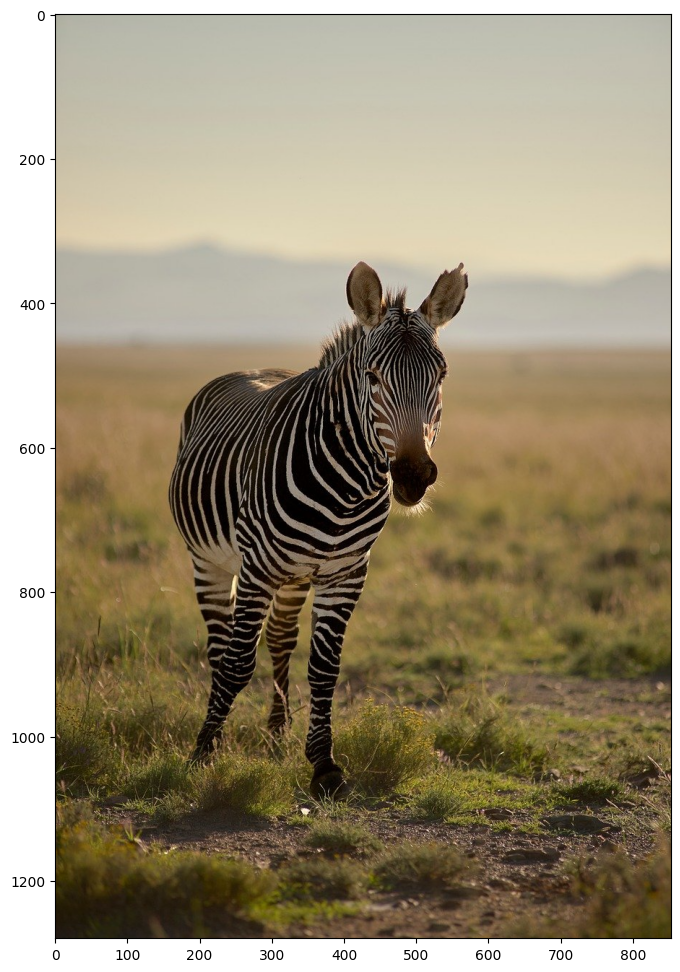

In [ ]:
img = plt.imread('zebra.png')
if img.shape[2] == 4:
    img = img[..., :3]  # usuwanie alpha przy RGBA

if img.max() <= 1.0:
    img = (img * 255).astype(np.uint8)

plt.figure(figsize=(12, 12))
plt.imshow(img)
plt.show()

In [ ]:
Sx = np.array([
    [1, 0, -1],
    [2, 0, -2],
    [1, 0, -1]
])
Sy = np.array([
    [1, 2, 1],
    [0, 0, 0],
    [-1, -2, -1]
])

In [ ]:
gx = convolve2d_color(img, Sx)
gy = convolve2d_color(img, Sy)

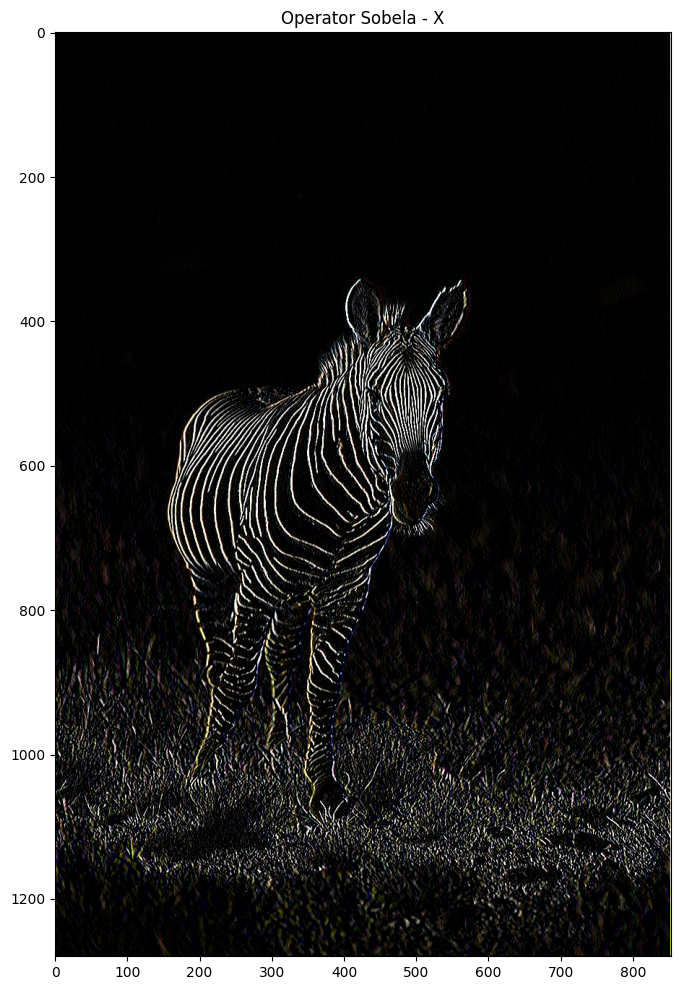

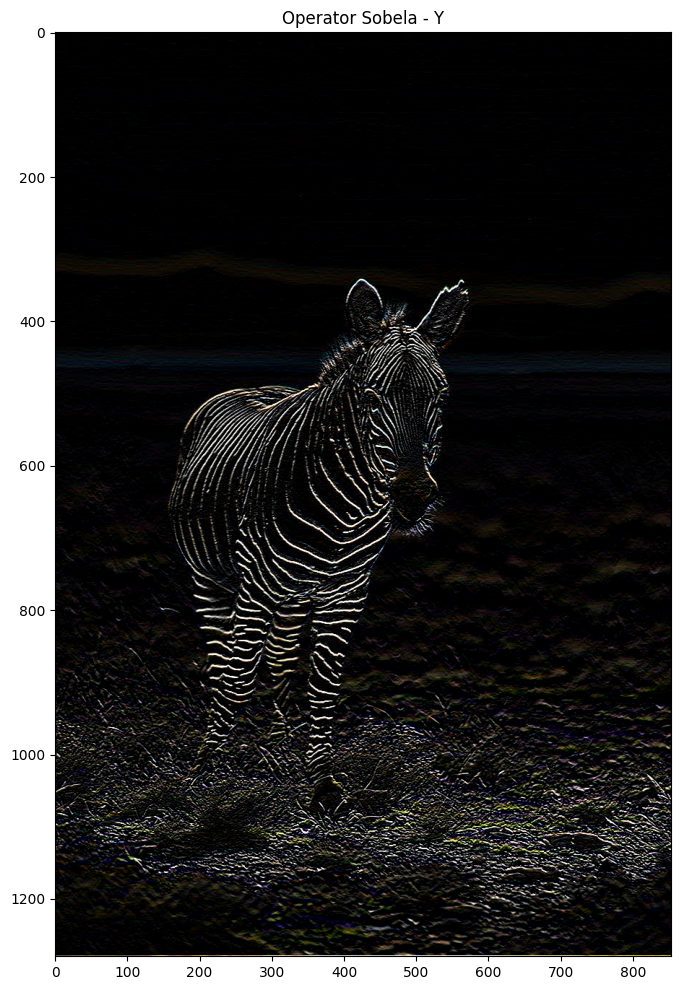

In [ ]:
plt.figure(figsize=(12, 12))
plt.title('Operator Sobela - X')
plt.imshow(gx)
plt.figure(figsize=(12, 12))
plt.title('Operator Sobela - Y')
plt.imshow(gy)
plt.show()

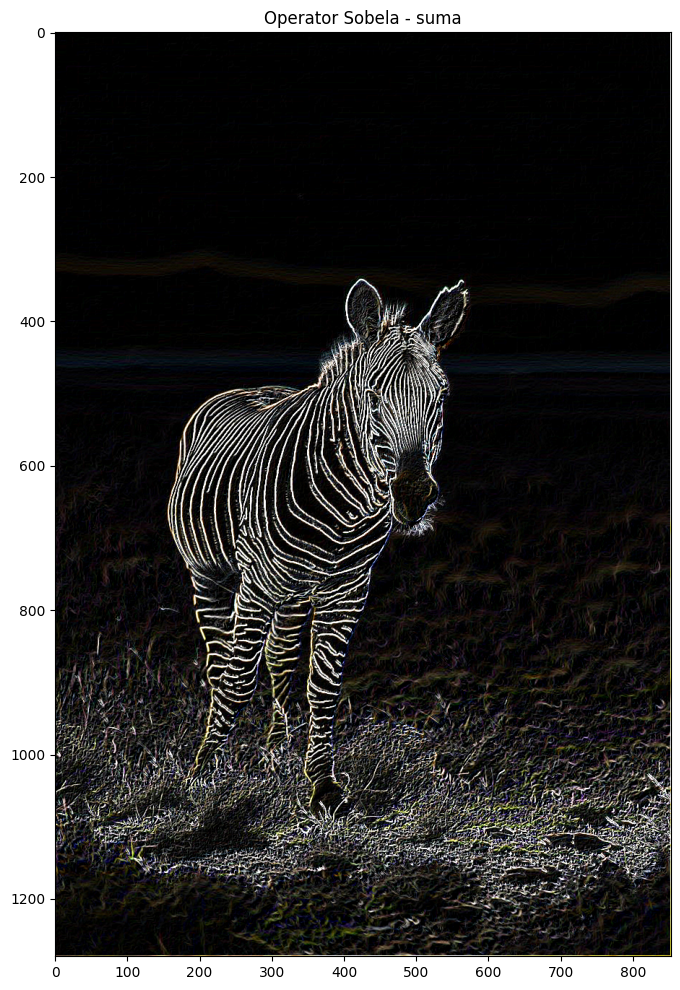

In [ ]:
gradient = np.sqrt(gx.astype(float)**2 + gy.astype(float)**2)
gradient = np.clip(gradient, 0, 255).astype(np.uint8)

plt.figure(figsize=(12, 12))
plt.title('Operator Sobela - suma')
plt.imshow(gradient)
plt.show()

In [ ]:
L = np.array([
    [0, 1, 0],
    [1, -4, 1],
    [0, 1, 0]
])

In [ ]:
laplace = convolve2d_color(img, L)

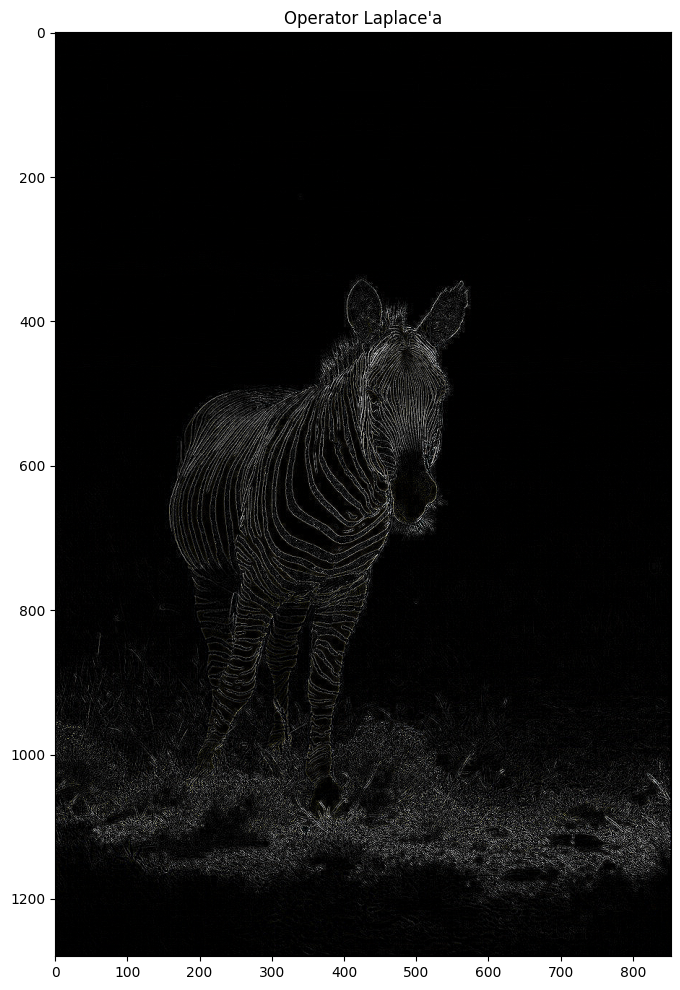

In [ ]:
plt.figure(figsize=(12, 12))
plt.title('Operator Laplace\'a')
plt.imshow(laplace)
plt.show()

In [ ]:
Px = [
    [-1, 0, 1],
    [-1, 0, 1],
    [-1, 0, 1]
]

Py = [
    [-1, -1, -1],
    [ 0,  0,  0],
    [ 1,  1,  1]
]

In [ ]:
px = convolve2d_color(img, Sx)
py = convolve2d_color(img, Sy)

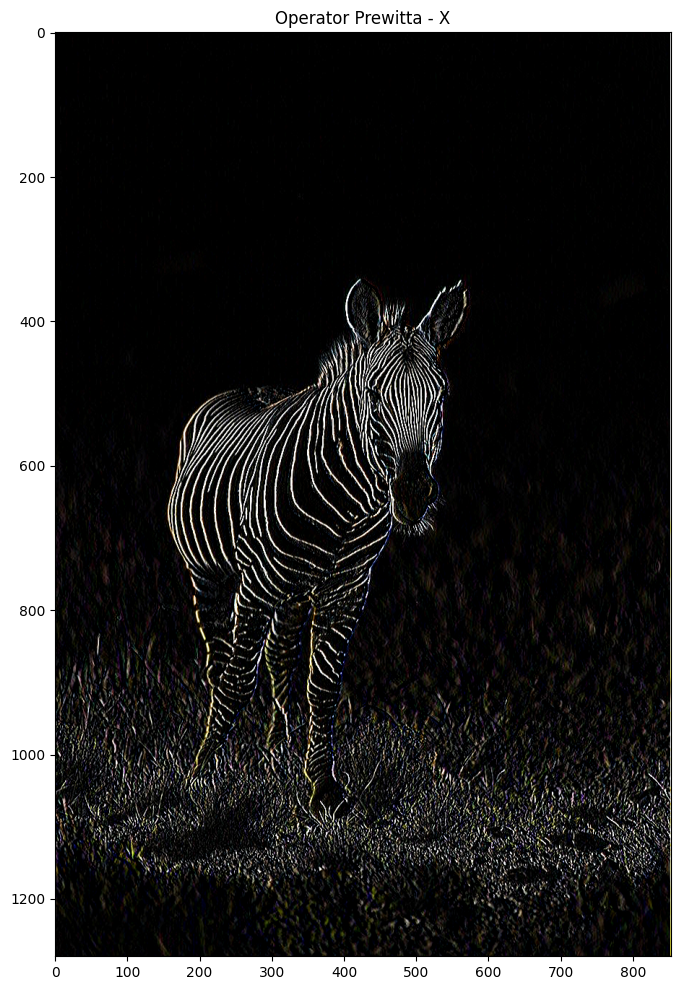

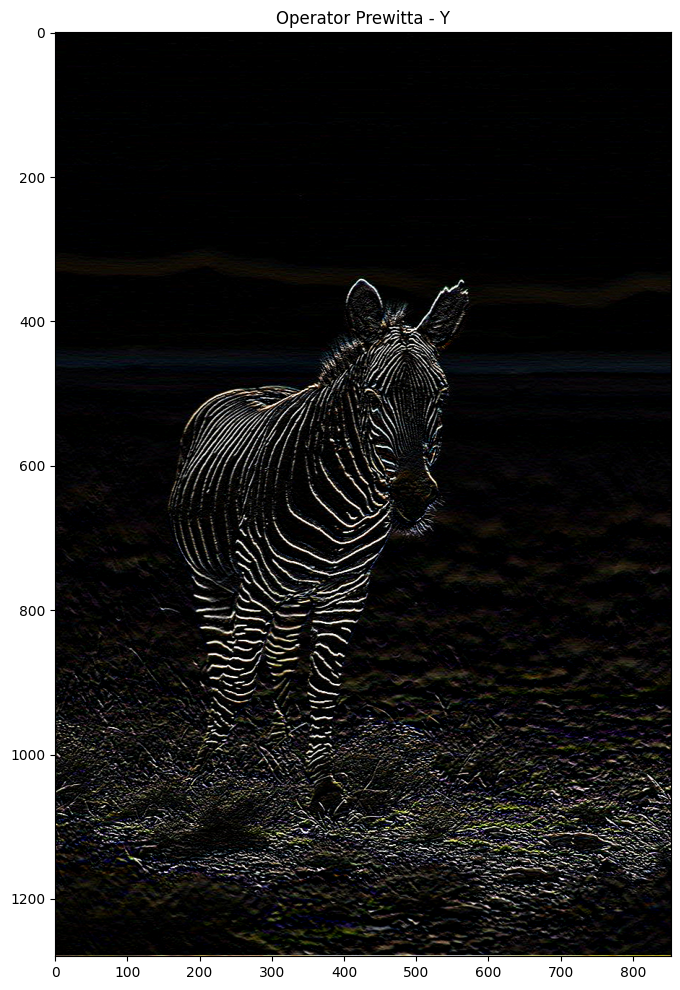

In [ ]:
plt.figure(figsize=(12, 12))
plt.title('Operator Prewitta - X')
plt.imshow(px)
plt.figure(figsize=(12, 12))
plt.title('Operator Prewitta - Y')
plt.imshow(py)
plt.show()

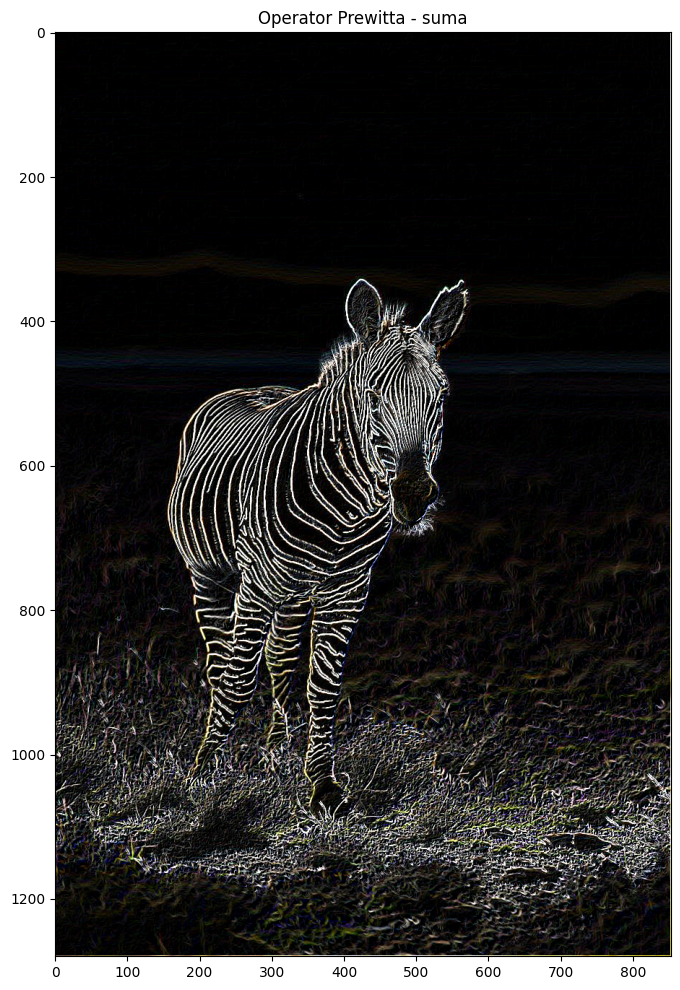

In [ ]:
gradient_p = np.sqrt(px.astype(float)**2 + py.astype(float)**2)
gradient_p = np.clip(gradient_p, 0, 255).astype(np.uint8)

plt.figure(figsize=(12, 12))
plt.title('Operator Prewitta - suma')
plt.imshow(gradient_p)
plt.show()

In [ ]:
Scx = [
    [  3,   0,  -3],
    [ 10,   0, -10],
    [  3,   0,  -3]
]

Scy = [
    [  3,  10,   3],
    [  0,   0,   0],
    [ -3, -10,  -3]
]

In [ ]:
scx = convolve2d_color(img, Sx)
scy = convolve2d_color(img, Sy)

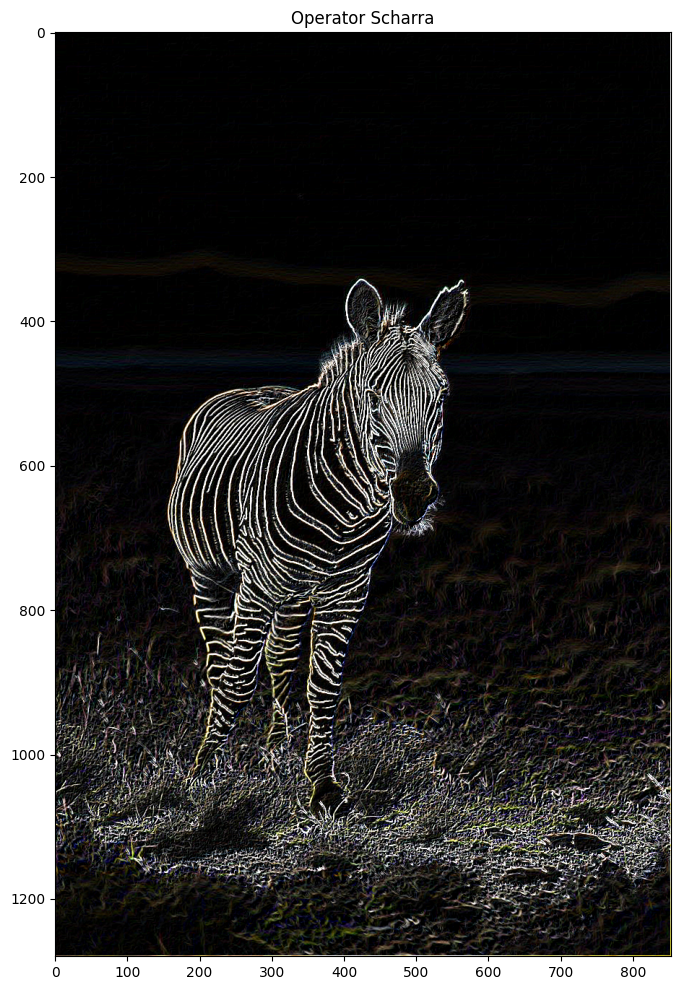

In [ ]:
gradient_sc = np.sqrt(scx.astype(float)**2 + scy.astype(float)**2)
gradient_sc = np.clip(gradient_sc, 0, 255).astype(np.uint8)

plt.figure(figsize=(12, 12))
plt.title('Operator Scharra')
plt.imshow(gradient_sc)
plt.show()

In [ ]:
def gaussian_kernel(size=3, sigma=1.0):
    ax = np.arange(-size // 2 + 1., size // 2 + 1.)
    xx, yy = np.meshgrid(ax, ax)

    kernel = np.exp(-(xx**2 + yy**2) / (2. * sigma**2))
    kernel = kernel / np.sum(kernel)
    return kernel

In [ ]:
G = 1 / 16 * np.array([
    [1, 2, 1],
    [1, 4, 1],
    [1, 2, 1]
])

In [ ]:
gaussian = convolve2d_color(img, G)

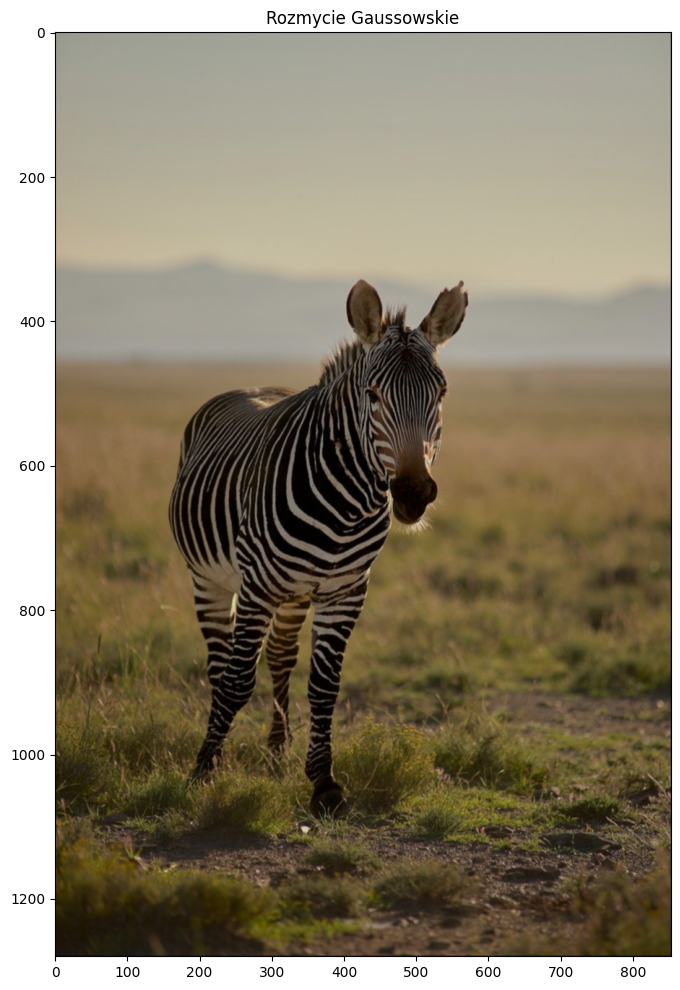

In [ ]:
plt.figure(figsize=(12, 12))
plt.title('Rozmycie Gaussowskie')
plt.imshow(gaussian)
plt.show()

In [ ]:
W = np.array([
    [0, -1, 0],
    [-1, 5, -1],
    [0, -1, 0]
])

In [ ]:
wyostrzone = convolve2d_color(img, W)

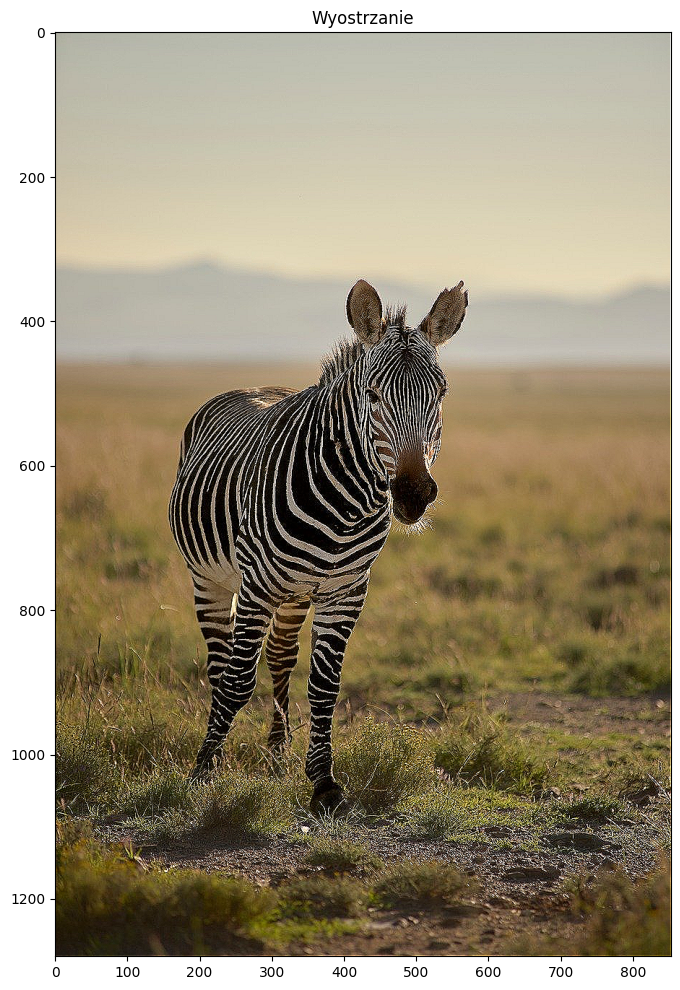

In [ ]:
plt.figure(figsize=(12, 12))
plt.title('Wyostrzanie')
plt.imshow(wyostrzone)
plt.show()